In [147]:
# @title Import all the libraries and images { display-mode: "code" }
import IPython.display as display
import os
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False
import numpy as np
import PIL.Image
import time
import functools

content_urls = dict(
  yellow_labrador = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg'),
  sea_turtle = tf.keras.utils.get_file('sea_turtle.jpg', 'https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg'),
  tuebingen= tf.keras.utils.get_file('tubingen.jpg','https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg'),
  grace_hopper= tf.keras.utils.get_file('grace_hoppe.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/grace_hopper.jpg'),
)
style_urls = dict(
  kadinsky = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg'),
  picasso_bottle_of_rum =  tf.keras.utils.get_file('picasso_bottole_of_rum.jpg','https://upload.wikimedia.org/wikipedia/en/7/7f/Pablo_Picasso%2C_1911%2C_Still_Life_with_a_Bottle_of_Rum%2C_oil_on_canvas%2C_61.3_x_50.5_cm%2C_Metropolitan_Museum_of_Art%2C_New_York.jpg')
)

In [148]:
# @title Define image loading and visualization functions  { display-mode: "code" }
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

A list of content images and a list of style images are uploaded via their URLs.

The load_img function is used to decode the image.

The imshow function is used to display the image.

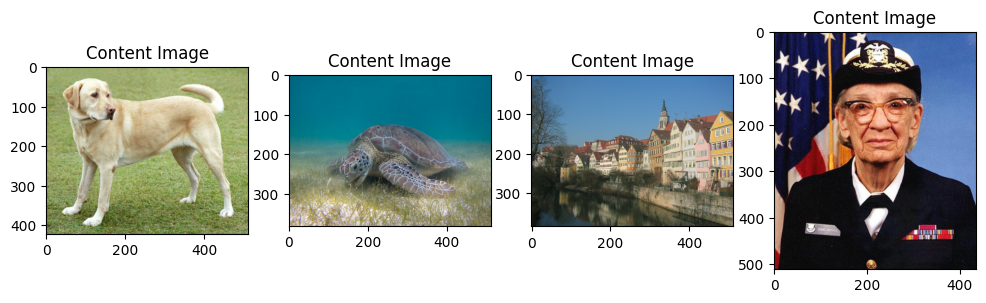

In [149]:
# @title Display examples of content images  { display-mode: "code" }
for n, img in enumerate(content_urls):
  plt.subplot(1, 4, n+1)
  imshow(load_img(content_urls[img]), 'Content Image')

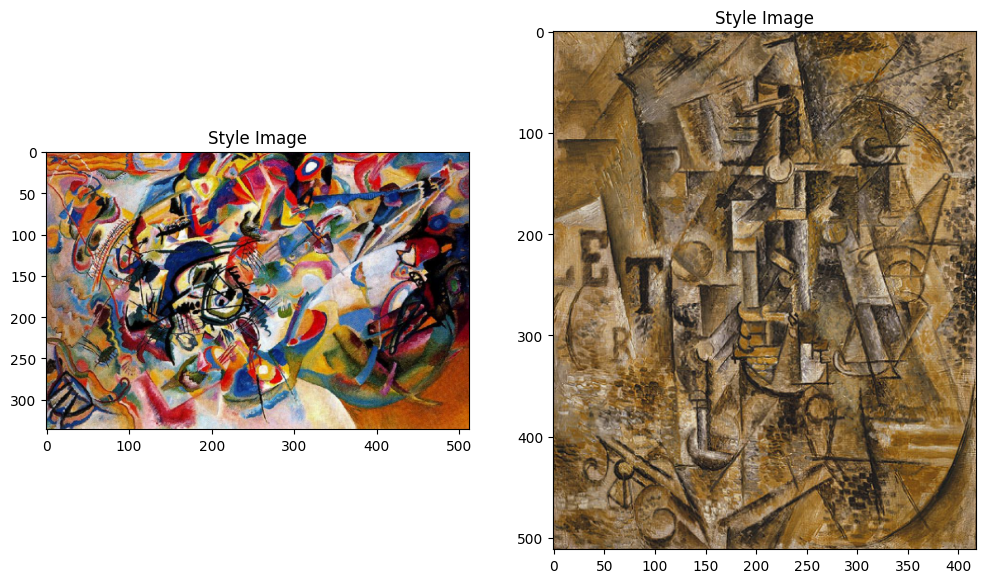

In [150]:
# @title Display examples of style images  { display-mode: "code" }
for n, img in enumerate(style_urls):
  plt.subplot(1, 2, n+1)
  imshow(load_img(style_urls[img]), 'Style Image')

It can be observed that all the content images have a clear shape or figure such as an animal. So even after the style transfer, the shape should be preserved and can be easily idendified with visual perception to investigate the stylized image quality, resulting in low content loss.

In contrast, the style images tend to have more distinctive textures, patterns and color palettes instead of a clear figure. Textures is an important aspect of these style images because the stylized images often show the same textures. To improve the image quality of the stylized image, the sliced wasserstein style transfer use the Sliced Wasserstine Distance and Loss to produc stylized image with controlled texture loss, thus reducing style loss.

I will use the yellow labrador as the content image and use both style images to product two stylized images for comparison.

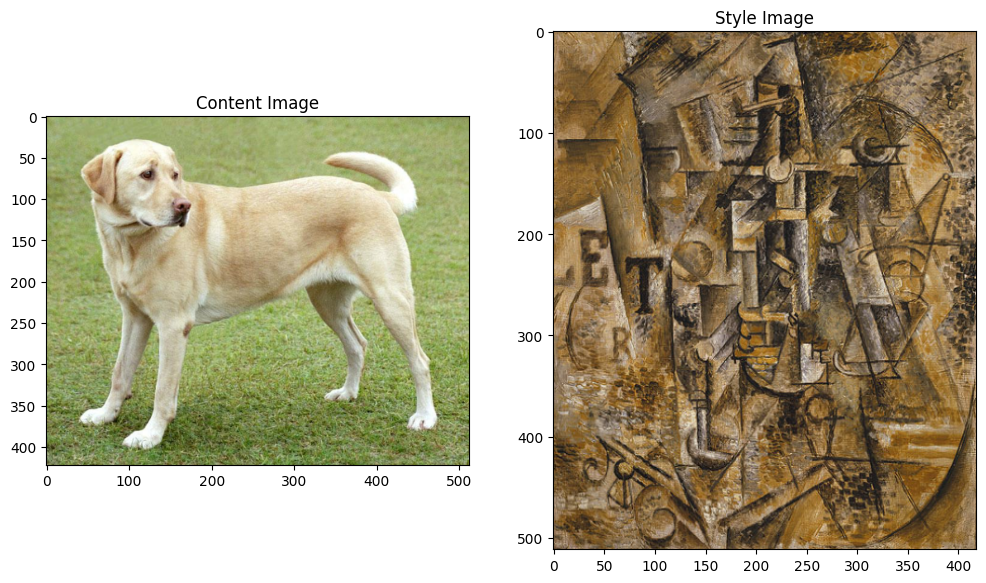

In [151]:
content_image = load_img(content_urls["yellow_labrador"])
style_image_1 = load_img(style_urls["picasso_bottle_of_rum"])
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')
plt.subplot(1, 2, 2)
imshow(style_image_1, 'Style Image')

In [152]:
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [153]:
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]

[('Labrador_retriever', 0.49317107),
 ('golden_retriever', 0.23665293),
 ('kuvasz', 0.03635751),
 ('Chesapeake_Bay_retriever', 0.024182767),
 ('Greater_Swiss_Mountain_dog', 0.018646102)]

Using the VGG-19 CNN that's already been pretrained on some large dataset, we can get the top five labels for the input image of a yellow labrador. The top label is "labrador retriver" which proves that this CNN has corrected recognitized the input image.

At this point, all the intermediate layers have already been populated with different activiation values. In other words, we have obtained the numerous feature maps of the yellow labrador image. This is important as we can select and combine layers that represents the content and style image of an input image. The "content" of the image can be considered the singular shape presented the image whereas the "style" are the more granular features of an image, such as edges and flows.

In [154]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

for layer in vgg.layers:
  print(layer.name)

input_38
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


By listing all the layers that make up the VGG-19 convolutional network, we see that there are 16 convolutional layers and 5 pooling layers. The network also has three fully-connected layers in the end which will not be the focus of image style transfer

In [155]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In this step, certain layers have been selected to be used to represent the content image and the style image. For content image, "block2_conv2" is selected because it further down the pipeline of CNN which means that at this point the neural netowrk has already learned the overarching shape of the yellow labrador, such as the shape of its tail. Multiple style layers have been selected fully capture the different style

For now, the same intermediate layers as the Tensorflow tutorial from https://www.tensorflow.org/tutorials/generative/style_transfer are used.

In [156]:
def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [157]:
"""Use the vgg_layer function to extract the intermediate layers' outputs for the style image"""
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image_1*255.0)

#Look at the statistics of each layer's output
#Note that the style_image was not preprocessed
#Python’s zip() function allows you to iterate in parallel over two or more iterables
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 512, 418, 64)
  min:  0.0
  max:  688.47217
  mean:  27.515446

block2_conv1
  shape:  (1, 256, 209, 128)
  min:  0.0
  max:  3343.603
  mean:  149.33353

block3_conv1
  shape:  (1, 128, 104, 256)
  min:  0.0
  max:  5891.2993
  mean:  139.24756

block4_conv1
  shape:  (1, 64, 52, 512)
  min:  0.0
  max:  14129.491
  mean:  530.5723

block5_conv1
  shape:  (1, 32, 26, 512)
  min:  0.0
  max:  2003.0122
  mean:  39.07301



In [158]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

At this point, the gram matrix is implememnted to be the overall representation of the style for a given layer from the VGG-19. Each style layer will go thru the gram_matrix function first before the gradient descent stage.

In [159]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    """ self.vgg use the vgg_layer function that's defined previously"""
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0 # scaled to [0, 255] since VGG19 was trained with input in that range

    #Preprocess the input image, either the
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [160]:
"""An instance of StyleContentModel called extractor is created """
extractor = StyleContentModel(style_layers, content_layers)
#Extract the style layers from the style image to be target style values
style_targets = extractor(style_image_1)['style']

#Extract the content layers from the content image to be target content values
content_targets = extractor(content_image)['content']
print('Styles from the style image:')
for name, output in sorted(style_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print('Contents from the content image:')
for name, output in sorted(content_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

Styles from the style image:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0002079198
    max:  7562.4634
    mean:  407.54898

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  129971.164
    mean:  16709.19

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  283456.75
    mean:  13447.607

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  5448137.0
    mean:  215781.52

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  66110.22
    mean:  1268.8112

Contents from the content image:
   block5_conv2
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  2410.8796
    mean:  13.764149



In [161]:
image = tf.Variable(content_image)

In [162]:
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [163]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [164]:
style_weight=1e-2
content_weight=1e4

To optimize this, use a weighted combination of the two losses to get the total loss:

In [165]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [166]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

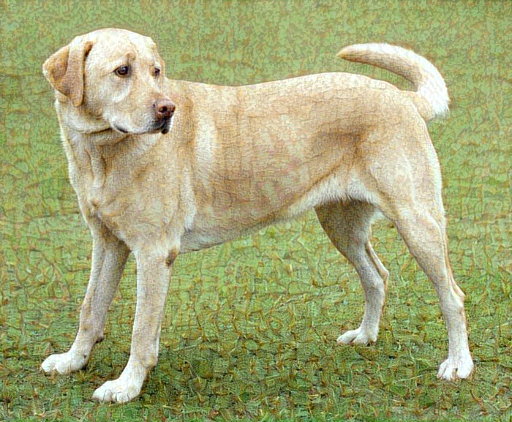

In [167]:
# @title First Attempt  { display-mode: "code" }
train_step(image)
train_step(image)
train_step(image)
stylized_image_1 = tensor_to_image(image)
display.display(stylized_image_1)

In [168]:
#Compute the SSIM
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import cv2
before = content_image
# Remove the batch dimension
before = tf.squeeze(before, axis=0)
before = np.array(before).astype(np.uint8)
gray_before = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)

after = stylized_image_1

after = np.array(after).astype(np.uint8)
gray_after = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)
# Compute SSIM between the two images
(score, diff) = ssim(gray_before, gray_after, full=True)
print("SSIM for content image and stylized image: {}".format(score))

SSIM for content image and stylized image: 7.482061217607621e-05


In [169]:
#Compute the SSIM
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import cv2
before = style_image_1
# Remove the batch dimension
before = tf.squeeze(before, axis=0)
before = np.array(before).astype(np.uint8)
gray_before = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)

gray_before = cv2.resize(gray_before,(512,422))
print(np.shape(gray_before))
after = stylized_image_1
after = np.array(after).astype(np.uint8)
gray_after = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)
print(np.shape(gray_after))
if gray_before.shape != gray_after.shape:
    gray_before = cv2.resize(gray_before, gray_after.shape)
# Compute SSIM between the two images
(score, diff) = ssim(gray_before, gray_after, full=True)
print("SSIM for style image and stylized image: {}".format(score))

(422, 512)
(422, 512)
SSIM for style image and stylized image: 6.636258603709086e-05


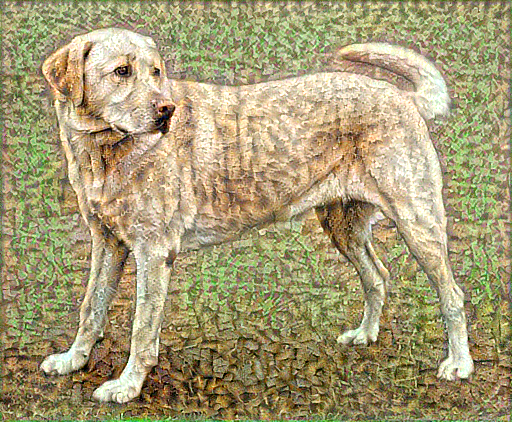

Train step: 25
Total time: 2.1


In [170]:
# @title Second Attempt with more training steps { display-mode: "code" }

import time
start = time.time()

epochs = 5
steps_per_epoch = 5

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
stylized_image_2 = tensor_to_image(image)
print("Total time: {:.1f}".format(end-start))

In [171]:
#Compute the SSIM
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import cv2
before = content_image
# Remove the batch dimension
before = tf.squeeze(before, axis=0)
before = np.array(before).astype(np.uint8)
gray_before = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)

after = tensor_to_image(image)

after = np.array(after).astype(np.uint8)
gray_after = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)
# Compute SSIM between the two images
(score, diff) = ssim(gray_before, gray_after, full=True)
print("SSIM for content iamge and stylized image: {}".format(score))

SSIM for content iamge and stylized image: 2.8651246621397113e-05


In [172]:
#Compute the SSIM
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
import cv2
before = style_image_1
# Remove the batch dimension
before = tf.squeeze(before, axis=0)
before = np.array(before).astype(np.uint8)
gray_before = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)

gray_before = cv2.resize(gray_before,(512,422))
print(np.shape(gray_before))
after = tensor_to_image(image)
after = np.array(after).astype(np.uint8)
gray_after = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)
print(np.shape(gray_after))
if gray_before.shape != gray_after.shape:
    gray_before = cv2.resize(gray_before, gray_after.shape)
# Compute SSIM between the two images
(score, diff) = ssim(gray_before, gray_after, full=True)
print("SSIM for style image and stylized image: {}".format(score))

(422, 512)
(422, 512)
SSIM for style image and stylized image: 2.4788785630050307e-05


After computing the SSIM for the first attempt and second attempt, we see the scores are all very low for both the content vs. stylized and style vs. stylized comparisons. It is suspected that due to the nuanced changes introduced by the style image, the SSIM is not the ideal numerical measure for style transfer optimization.
Instead, visual inspection may be the better method of seeing if the style transfer has been performed with success.

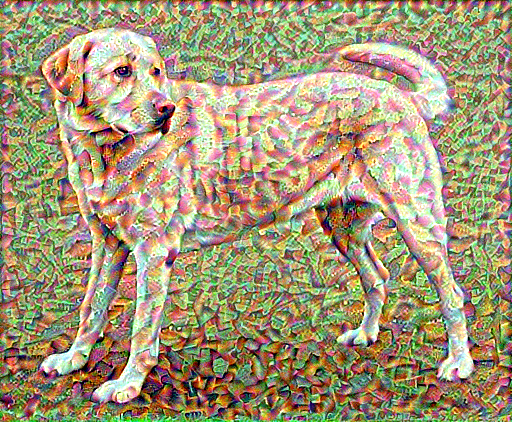

Train step: 25
Total time: 4.4


In [173]:
# @title Third Attempt with a different style image { display-mode: "code" }
style_image_2 = load_img(style_urls["kadinsky"])
style_targets = extractor(style_image_2)['style']
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

start = time.time()
epochs = 5
steps_per_epoch = 5

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

Styles from the style image:
   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  66110.22
    mean:  1268.8112

Contents from the content image:
   block5_conv2
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  2410.8796
    mean:  13.764149



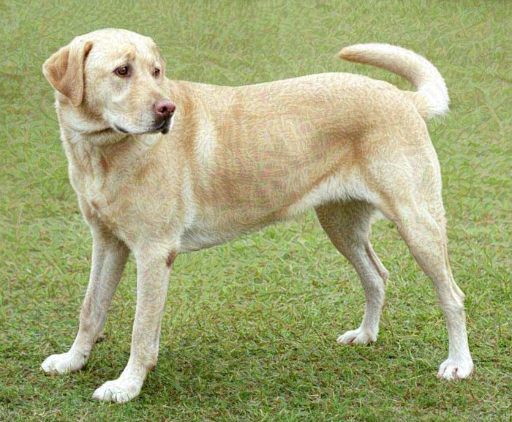

In [174]:
# @title Fourth Attempt with just one style layer { display-mode: "code" }

content_layers = ['block5_conv2']

style_layers = [
                'block5_conv1']
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image_1)['style']
content_targets = extractor(content_image)['content']
print('Styles from the style image:')
for name, output in sorted(style_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print('Contents from the content image:')
for name, output in sorted(content_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

train_step(image)
train_step(image)
train_step(image)

tensor_to_image(image)


Styles from the style image:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.0002079198
    max:  7562.4634
    mean:  407.54898

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  129971.164
    mean:  16709.19

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.0
    max:  283456.75
    mean:  13447.607

Contents from the content image:
   block5_conv2
    shape:  (1, 26, 32, 512)
    min:  0.0
    max:  2410.8796
    mean:  13.764149



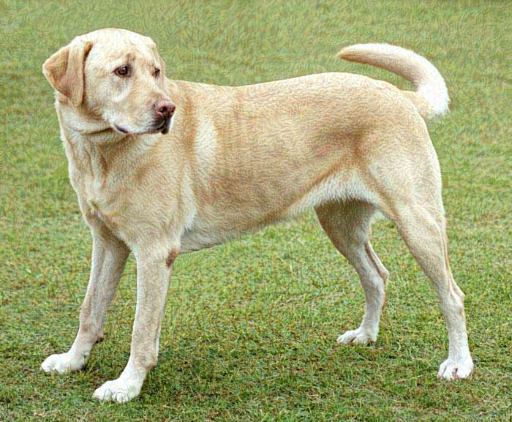

In [175]:
# @title Fifth Attempt with three style layers { display-mode: "code" }

content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1'
                ]
num_content_layers = len(content_layers)
num_style_layers = len(style_layers)
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image_1)['style']
content_targets = extractor(content_image)['content']
print('Styles from the style image:')
for name, output in sorted(style_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print('Contents from the content image:')
for name, output in sorted(content_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

train_step(image)
train_step(image)
train_step(image)

tensor_to_image(image)

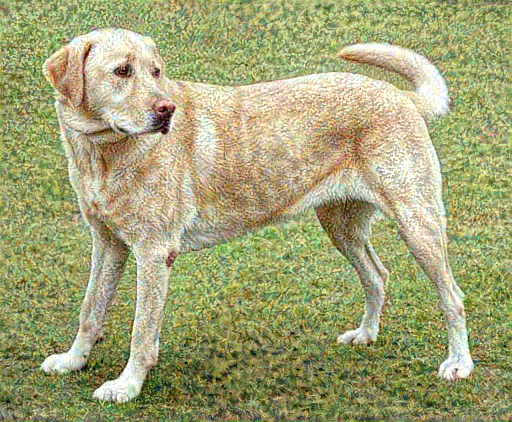

Train step: 25
Total time: 28.7


In [176]:
# @title Sixth Attempt with more training steps on the fifth attempt { display-mode: "code" }

epochs = 5
steps_per_epoch = 5

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In the following the sections, the Sliced Wasserstein Distance style transfer will be investigated.

The following sections will demonstrate the use of SWD as the algorithm for calculating the style loss.

The difference between Gram Matrix and SWD is the way that the loss function is computed. For Gram Matrix style transfer, it is an algorithm applied on each selected activation layer extracted from the style image when it goes thru vgg. So when the loss function calculates the MSE (differences in styles at the matching layer between the style targets and the trained image), it is able to use the result from Gram Matrx to accurately analyze the style difference.

In contrast, the SWD seeks to transform both the style targets and the style layers of the changing image under training. It measures the "distance" between each pair of style layer to be the style loss in the loss function. Due to the mathematical limitation, the content image and the style image need to be of the same dimension between extracting their respective content and feature layers.



(1, 512, 512, 3)
(1, 512, 512, 3)


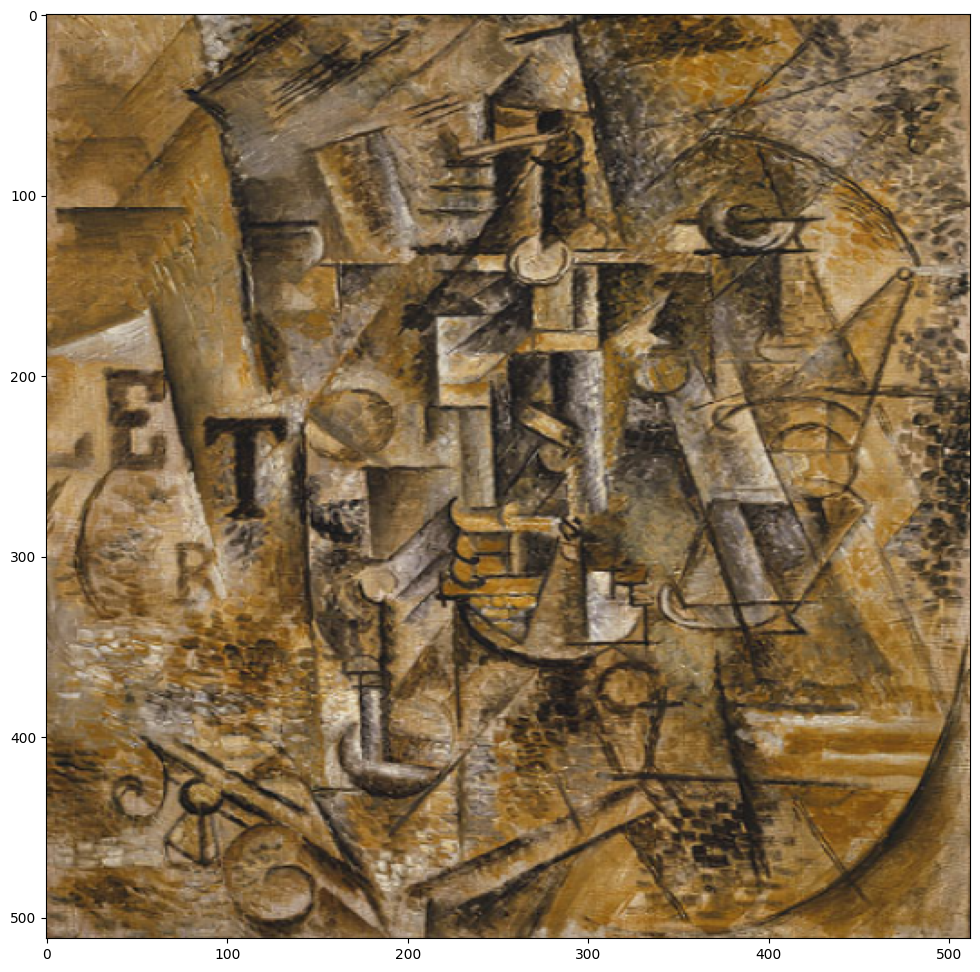

In [180]:
target_height = 512
target_width = 512
content_image= tf.image.resize(content_image, [target_height, target_width])
style_image_1 = tf.image.resize(style_image_1, [target_height, target_width])
print(np.shape(content_image))
print(np.shape(style_image_1))
imshow(style_image_1)

In [181]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    """ self.vgg use the vgg_layer function that's defined previously"""
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0 # scaled to [0, 255] since VGG19 was trained with input in that range

    #Preprocess the input image, either the
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])
    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [188]:
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image_1)['style']
#Extract the content layers from the content image to be target content values
content_targets = extractor(content_image)['content']
# for style in style_targets:
  # print (style_targets[style].shape)
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)
print('Styles from the style image:')
for name, output in sorted(style_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

Styles from the style image:
   block1_conv1
    shape:  (1, 512, 512, 64)
    min:  0.0
    max:  524.0887
    mean:  17.638285

   block2_conv1
    shape:  (1, 256, 256, 128)
    min:  0.0
    max:  3295.9153
    mean:  114.652466

   block3_conv1
    shape:  (1, 128, 128, 256)
    min:  0.0
    max:  4640.68
    mean:  106.41697

   block4_conv1
    shape:  (1, 64, 64, 512)
    min:  0.0
    max:  10234.983
    mean:  426.0935

   block5_conv1
    shape:  (1, 32, 32, 512)
    min:  0.0
    max:  1453.1761
    mean:  31.54531



In [183]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    loss = 0
    style_loss = 0
    for style_name in style_targets:
        style_tensor = style_targets[style_name]
        output_tensor = style_outputs[style_name]

        b, h, w, dim = style_tensor.shape
        n = h * w
        activations_style = tf.reshape(style_tensor, (b, dim, n))

        b, h, w, dim = output_tensor.shape
        n = h * w

        activations_output = tf.reshape(output_tensor, (b, dim, n))
        Ndirection = dim
        directions = tf.random.normal((Ndirection, dim), dtype=tf.float32)
        directions = directions / tf.sqrt(tf.reduce_sum(directions ** 2, axis=1, keepdims=True))

        # Project activations over random directions
        projected_activations_example = tf.einsum('bdn,md->bmn', activations_style, directions)
        projected_activations_generated = tf.einsum('bdn,md->bmn', activations_output, directions)

        # Sort the projections
        sorted_activations_example = tf.sort(projected_activations_example, axis=2)
        sorted_activations_generated = tf.sort(projected_activations_generated, axis=2)

        # L2 over sorted lists
        style_loss += tf.reduce_mean((sorted_activations_example - sorted_activations_generated) ** 2)

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

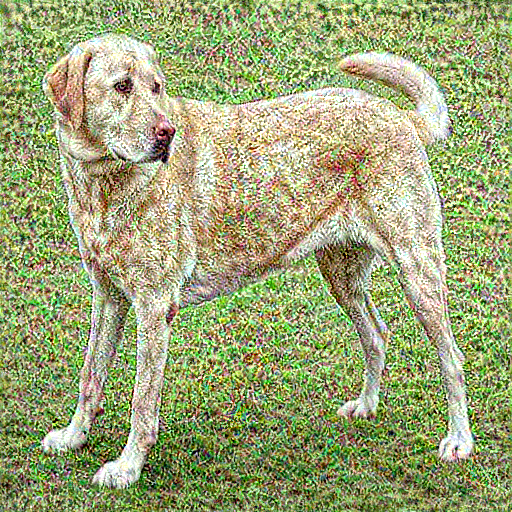

Train step: 100
Total time: 17.5


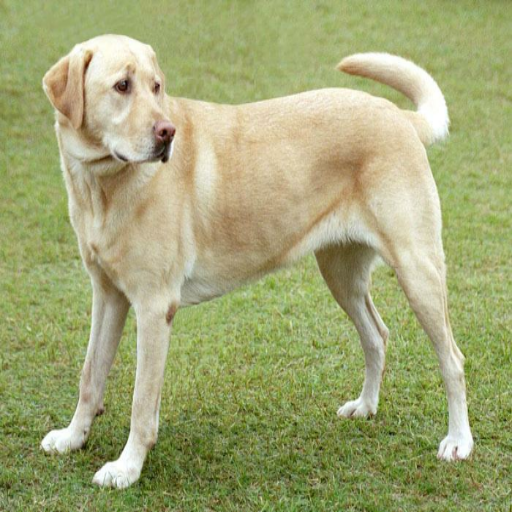

In [184]:
# @title First Attempt with SWD { display-mode: "code" }
epochs = 10
steps_per_epoch = 10
start = time.time()
step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))
tensor_to_image(content_image)

In [189]:
style_image_2 = load_img(style_urls["kadinsky"])
style_image_2 = tf.image.resize(style_image_2, [target_height, target_width])
print(np.shape(content_image))
print(np.shape(style_image_2))
imshow(style_image_2)
extractor = StyleContentModel(style_layers, content_layers)
style_targets = extractor(style_image_2)['style']
#Extract the content layers from the content image to be target content values
content_targets = extractor(content_image)['content']
print('Styles from the style image:')
for name, output in sorted(style_targets.items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()


Output hidden; open in https://colab.research.google.com to view.

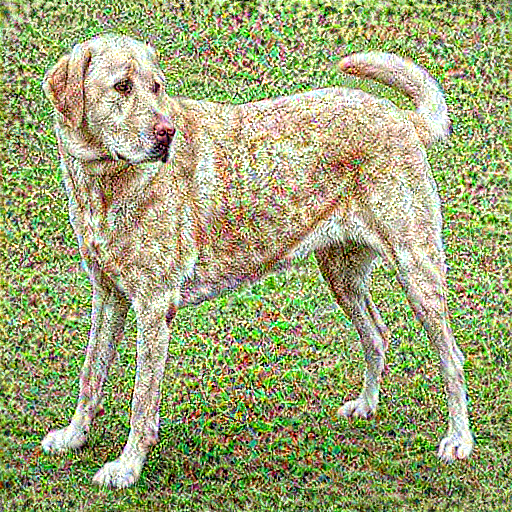

Train step: 100
Total time: 20.2


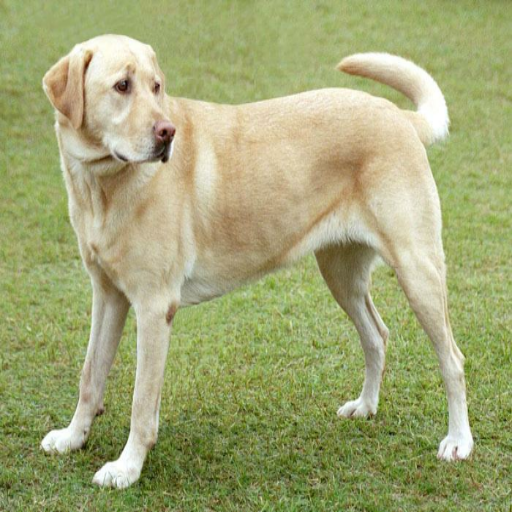

In [190]:
# @title Second Attempt using SWD with a different style image { display-mode: "code" }
style_targets = extractor(style_image_2)['style']
#Extract the content layers from the content image to be target content values
content_targets = extractor(content_image)['content']
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    loss = 0
    style_loss = 0
    for style_name in style_targets:
        style_tensor = style_targets[style_name]
        output_tensor = style_outputs[style_name]

        b, h, w, dim = style_tensor.shape
        n = h * w
        activations_style = tf.reshape(style_tensor, (b, dim, n))

        b, h, w, dim = output_tensor.shape
        n = h * w

        activations_output = tf.reshape(output_tensor, (b, dim, n))
        Ndirection = dim
        directions = tf.random.normal((Ndirection, dim), dtype=tf.float32)
        directions = directions / tf.sqrt(tf.reduce_sum(directions ** 2, axis=1, keepdims=True))

        # Project activations over random directions
        projected_activations_example = tf.einsum('bdn,md->bmn', activations_style, directions)
        projected_activations_generated = tf.einsum('bdn,md->bmn', activations_output, directions)

        # Sort the projections
        sorted_activations_example = tf.sort(projected_activations_example, axis=2)
        sorted_activations_generated = tf.sort(projected_activations_generated, axis=2)

        # L2 over sorted lists
        style_loss += tf.reduce_mean((sorted_activations_example - sorted_activations_generated) ** 2)

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

epochs = 10
steps_per_epoch = 10
start = time.time()
step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))
tensor_to_image(content_image)